# Laboratorio 02 - Series de Tiempo

#### Juan Lorthiois - 18771
#### Renato Estrada - 181099
#### Roberto Castillo - 18546
#### Jose Lucha - 18904

In [2]:
# importando las librerias

import pandas as pd
import numpy as np
import datetime as dt
from matplotlib.pyplot import figure
from quickda.explore_data import *

In [3]:
# importando los datos

df = pd.read_csv("GlobalLandTemperaturesByCountry.csv")

## EDA

In [4]:
#para poder ver todas las columnas y filas

pd.set_option('display.max_columns', None)  
pd.set_option('display.max_rows', None)

In [4]:
# primer vistazo a las primeras 10 filas

df.head(10)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland
5,1744-04-01,1.530,4.680,Åland
6,1744-05-01,6.702,1.789,Åland
7,1744-06-01,11.609,1.577,Åland
8,1744-07-01,15.342,1.410,Åland
9,1744-08-01,NaN,NaN,Åland


In [5]:
# Ultimas 10 filas

df.tail(10)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
577452,01/12/2012,24.111,0.846,Zimbabwe
577453,01/01/2013,23.812,1.218,Zimbabwe
577454,01/02/2013,24.075,1.286,Zimbabwe
577455,01/03/2013,23.226,0.564,Zimbabwe
577456,01/04/2013,21.142,0.495,Zimbabwe
577457,01/05/2013,19.059,1.022,Zimbabwe
577458,01/06/2013,17.613,0.473,Zimbabwe
577459,01/07/2013,17.000,0.453,Zimbabwe
577460,01/08/2013,19.759,0.717,Zimbabwe
577461,01/09/2013,NaN,NaN,Zimbabwe


In [5]:
#Averiguando más sobre las variables

explore(df, method="summarize")


,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
AverageTemperature,float64,544811,32651,0.057,52028,-37.658,10.025,20.901,25.814,38.842,17.193354,20.901,10.953966,-1.114297
AverageTemperatureUncertainty,float64,545550,31912,0.055,8979,0.052,0.323,0.571,1.206,15.003,1.019057,0.571,1.20193,3.142598
Country,object,577462,0,0.000,243,Afghanistan,-,-,-,Åland,-,-,-,-
dt,object,577462,0,0.000,3239,01/01/1900,-,-,-,1899-12-01,-,-,-,-


In [6]:
#Contando NAs en cada columna

df.isna().sum()

dt                                   0
AverageTemperature               32651
AverageTemperatureUncertainty    31912
Country                              0
dtype: int64

In [7]:
# Averiguando cuantas mediciones hay

df.shape

(577462, 4)

In [8]:
# Qué países son los que presentan mediciones?

print(pd.unique(df['Country']))

['Åland' 'Afghanistan' 'Africa' 'Albania' 'Algeria' 'American Samoa'
 'Andorra' 'Angola' 'Anguilla' 'Antarctica' 'Antigua And Barbuda'
 'Argentina' 'Armenia' 'Aruba' 'Asia' 'Australia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bahrain' 'Baker Island' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia'
 'Bonaire, Saint Eustatius And Saba' 'Bosnia And Herzegovina' 'Botswana'
 'Brazil' 'British Virgin Islands' 'Bulgaria' 'Burkina Faso' 'Burma'
 'Burundi' "Côte D'Ivoire" 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde'
 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Christmas Island' 'Colombia' 'Comoros'
 'Congo (Democratic Republic Of The)' 'Congo' 'Costa Rica' 'Croatia'
 'Cuba' 'Curaçao' 'Cyprus' 'Czech Republic' 'Denmark (Europe)' 'Denmark'
 'Djibouti' 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia' 'Europe'
 'Falkland Islands (Islas Malvinas)' 'Faroe Islands'
 'Federated States Of

### Procedimiento a seguir post-EDA

#### 1. Dado que el propósito es aplicar series de tiempo, es necesario ver algún tipo de estacionalidad, para esto vamos a separar los países en NORTE y SUR dependiendo de si se encuentran en el hemisferio norte o el hemisferio sur. Esto hará más aparente la estacionalidad de los dato y su tendencia general.

#### 2. Para obtener la lista de países y territorios al norte se utilizará la lista de la pagina de wikipedia: https://en.wikipedia.org/wiki/Northern_Hemisphere#List_of_Continents,_countries_or_territories,_and_oceans_in_the_Northern_Hemisphere

#### 3. Algunos países no reportan datos en todas las fechas, dado que queremos una perdida minima de información, se promediaran los datos sobre todo el hemisferio y se agregará dicho promedio cuando no haya temperatura reportada.

#### 4. El producto final post data-cleaning seran 2 bases de datos, una para el hemisferio norte, y tra para el hemisferio sur, con la fecha, y la temperatura promedio del hemisferio para dicha fecha.

#### 5. Con esto podremos fácilmente aplicar la series de tiempo y avaluar tendencias, hacer predicciones etc...

## Inicio del Data cleaning - Data preparation

In [9]:
# Importando lista de paises al norte

Df_paises =  pd.read_csv("TerritoriosYPaisesAlNorte.csv")

In [10]:
Df_paises.head(10)

,Country
0,Åland
1,Afghanistan
2,Africa
3,Akrotiri And Dhekelia
4,Albania
5,Algeria
6,Andaman Islands
7,Andorra
8,Anguilla
9,Antigua And Barbuda


In [11]:
# En caso de que haya caracteres especiales en los nombres los removemos

df['Country'] = df['Country'].str.replace('[^\w\s]', '')

/tmp/ipykernel_58271/903515587.py:3: FutureWarning:

The default value of regex will change from True to False in a future version.



In [12]:
# Hacemos lo mismo con Df_paises

Df_paises['Country'] = Df_paises['Country'].str.replace('[^\w\s]', '')

/tmp/ipykernel_58271/4039817937.py:3: FutureWarning:

The default value of regex will change from True to False in a future version.



In [13]:
# Veamos si todo esta bien

print(pd.unique(df['Country']))

['Åland' 'Afghanistan' 'Africa' 'Albania' 'Algeria' 'American Samoa'
 'Andorra' 'Angola' 'Anguilla' 'Antarctica' 'Antigua And Barbuda'
 'Argentina' 'Armenia' 'Aruba' 'Asia' 'Australia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bahrain' 'Baker Island' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia'
 'Bonaire Saint Eustatius And Saba' 'Bosnia And Herzegovina' 'Botswana'
 'Brazil' 'British Virgin Islands' 'Bulgaria' 'Burkina Faso' 'Burma'
 'Burundi' 'Côte DIvoire' 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde'
 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Christmas Island' 'Colombia' 'Comoros'
 'Congo Democratic Republic Of The' 'Congo' 'Costa Rica' 'Croatia' 'Cuba'
 'Curaçao' 'Cyprus' 'Czech Republic' 'Denmark Europe' 'Denmark' 'Djibouti'
 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador'
 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia' 'Europe'
 'Falkland Islands Islas Malvinas' 'Faroe Islands'
 'Federated States Of Microne

In [14]:
# Veamos si todo esta bien con Df_paises

print(pd.unique(Df_paises['Country']))

['Åland' 'Afghanistan' 'Africa' 'Akrotiri And Dhekelia' 'Albania'
 'Algeria' 'Andaman Islands' 'Andorra' 'Anguilla' 'Antigua And Barbuda'
 'Armenia' 'Aruba' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bioko' 'Bonaire' 'Borneo' 'Bosnia And Herzegovina' 'Virgin Islands'
 'Brunei' 'Bulgaria' 'Burkina Faso' 'Cambodia' 'Cameroon' 'Canada'
 'Cape Verde' 'Cayman Islands' 'Central African Republic' 'Chad' 'China'
 'Colombia' 'Costa Rica' 'Croatia' 'Curaçao' 'Cyprus' 'Czech Republic'
 'Denmark' 'Djibouti' 'Dominica' 'Dominican Republic' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia' 'Europe'
 'Faroe Islands' 'Finland' 'Formosa' 'France' 'Gambia' 'Georgia' 'Germany'
 'Ghana' 'Greece' 'Greenland' 'Grenada' 'Guam' 'Guatemala' 'Guernsey'
 'Guinea' 'GuineaBissau' 'Guyana' 'Hainan' 'Haiti' 'Hawaii' 'Honduras'
 'Hungary' 'Iceland' 'India' 'Iran' 'Iraq' 'Ireland' 'Isle Of Man'
 'Israel' 'Italy' 

In [15]:
#Revisamos para df

explore(df, method="summarize")

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
AverageTemperature,float64,544811,32651,0.057,52028,-37.658,10.025,20.901,25.814,38.842,17.193354,20.901,10.953966,-1.114297
AverageTemperatureUncertainty,float64,545550,31912,0.055,8979,0.052,0.323,0.571,1.206,15.003,1.019057,0.571,1.20193,3.142598
Country,object,577462,0,0.000,243,Afghanistan,-,-,-,Åland,-,-,-,-
dt,object,577462,0,0.000,3239,01/01/1900,-,-,-,1899-12-01,-,-,-,-


In [16]:
#Volvemos a revisar para Df_paises

explore(Df_paises, method="summarize")

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
Country,object,204,0,0.0,192,Afghanistan,-,-,-,Åland,-,-,-,-


In [17]:
#Algunos paises aparecen con el nombre (Europe) entre parentesis, hacemos una correccion

df_europeos = df[df['Country'].str.contains("Europe")]

In [18]:
# Chequamos esos nombres para agregarlos a la lista de paises del norte

print(pd.unique(df_europeos['Country']))

['Denmark Europe' 'Europe' 'France Europe' 'Netherlands Europe'
 'United Kingdom Europe']


In [19]:
# Perfecto! Solo son 5, los agregamos de inmediato al Df_paises Incluyendo el nombre raro, Åland, son una islas finlandesas)

# Creamos un df con los nombres
df_faltantes = pd.DataFrame({"Country":['Denmark Europe', 'Europe', 'France Europe', 'Netherlands Europe', 
                               'United Kingdom Europe']})

#Lo agregamos al existente

Df_paises = Df_paises.append(df_faltantes,ignore_index = True)

/tmp/ipykernel_58271/1092959117.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [20]:
Df_paises.tail() #listo!

,Country
204,Denmark Europe
205,Europe
206,France Europe
207,Netherlands Europe
208,United Kingdom Europe


In [21]:
#Preparando columna hemisferio

hemisferios_pais = []  

In [22]:
for name in df['Country']:
    if name in Df_paises['Country'].values:
        hemisferios_pais.append('N')
    else:
        hemisferios_pais.append('S')

In [23]:
#Finalmente podemos agregar la columna que identifica el hemisferio al que pertenece el pais

df['Hemisphere'] = hemisferios_pais

In [24]:
df.head(10)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country,Hemisphere
0,1743-11-01,4.384,2.294,Åland,N
1,1743-12-01,NaN,NaN,Åland,N
2,1744-01-01,NaN,NaN,Åland,N
3,1744-02-01,NaN,NaN,Åland,N
4,1744-03-01,NaN,NaN,Åland,N
5,1744-04-01,1.530,4.680,Åland,N
6,1744-05-01,6.702,1.789,Åland,N
7,1744-06-01,11.609,1.577,Åland,N
8,1744-07-01,15.342,1.410,Åland,N
9,1744-08-01,NaN,NaN,Åland,N


In [26]:
df.tail(10)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country,Hemisphere
577452,01/12/2012,24.111,0.846,Zimbabwe,S
577453,01/01/2013,23.812,1.218,Zimbabwe,S
577454,01/02/2013,24.075,1.286,Zimbabwe,S
577455,01/03/2013,23.226,0.564,Zimbabwe,S
577456,01/04/2013,21.142,0.495,Zimbabwe,S
577457,01/05/2013,19.059,1.022,Zimbabwe,S
577458,01/06/2013,17.613,0.473,Zimbabwe,S
577459,01/07/2013,17.000,0.453,Zimbabwe,S
577460,01/08/2013,19.759,0.717,Zimbabwe,S
577461,01/09/2013,NaN,NaN,Zimbabwe,S


In [25]:
#una vez más

explore(df, method="summarize")

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
AverageTemperature,float64,544811,32651,0.057,52028,-37.658,10.025,20.901,25.814,38.842,17.193354,20.901,10.953966,-1.114297
AverageTemperatureUncertainty,float64,545550,31912,0.055,8979,0.052,0.323,0.571,1.206,15.003,1.019057,0.571,1.20193,3.142598
Country,object,577462,0,0.000,243,Afghanistan,-,-,-,Åland,-,-,-,-
Hemisphere,object,577462,0,0.000,2,N,-,-,-,S,-,-,-,-
dt,object,577462,0,0.000,3239,01/01/1900,-,-,-,1899-12-01,-,-,-,-


### Ya tenemos los paises catalogados por hemisferio, ahora hay que encargarse del formato de las fechas algunas estan en dd/mm/yyy y otras en yyyy-mm-dd

In [26]:
#Convirtiendo tipo de objeto

df['dt'] = pd.to_datetime(df['dt'], dayfirst=True)

In [29]:
df.head(5000)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country,Hemisphere
0,1743-11-01,4.384,2.294,Åland,N
1,1743-12-01,NaN,NaN,Åland,N
2,1744-01-01,NaN,NaN,Åland,N
3,1744-02-01,NaN,NaN,Åland,N
4,1744-03-01,NaN,NaN,Åland,N
5,1744-04-01,1.530,4.680,Åland,N
6,1744-05-01,6.702,1.789,Åland,N
7,1744-06-01,11.609,1.577,Åland,N
8,1744-07-01,15.342,1.410,Åland,N
9,1744-08-01,NaN,NaN,Åland,N


In [30]:
#Chequeamos que las fechas esten en el formato adecuado

df.tail(5000) #Todo bien!

,dt,AverageTemperature,AverageTemperatureUncertainty,Country,Hemisphere
572462,1924-08-01,29.937,0.746,Yemen,N
572463,1924-09-01,28.920,1.011,Yemen,N
572464,1924-10-01,25.677,0.926,Yemen,N
572465,1924-11-01,23.201,0.504,Yemen,N
572466,1924-12-01,20.495,0.981,Yemen,N
572467,1925-01-01,20.049,0.927,Yemen,N
572468,1925-02-01,21.046,1.172,Yemen,N
572469,1925-03-01,24.513,0.707,Yemen,N
572470,1925-04-01,27.636,0.569,Yemen,N
572471,1925-05-01,29.631,0.953,Yemen,N


In [27]:
explore(df, method="summarize")

,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
AverageTemperature,float64,544811,32651,0.057,52028,-37.658,10.025,20.901,25.814,38.842,17.193354,20.901,10.953966,-1.114297
AverageTemperatureUncertainty,float64,545550,31912,0.055,8979,0.052,0.323,0.571,1.206,15.003,1.019057,0.571,1.20193,3.142598
Country,object,577462,0,0.000,243,Afghanistan,-,-,-,Åland,-,-,-,-
Hemisphere,object,577462,0,0.000,2,N,-,-,-,S,-,-,-,-
dt,datetime64[ns],577462,0,0.000,3239,1743-11-01 00:00:00,-,-,-,2013-09-01 00:00:00,-,-,-,-


#### Tomamos un momento para preparar el dataframe del ultimo inciso (Guatemala con prophet)

In [28]:
#extrayendo los datos para Guatemala

#Creamos el nuevo df_Guate:

df_Guate = pd.DataFrame({'dt': [], 'AverageTemperature' : [], 'Country': []})

#Ahora si

for i in range(len(df)):
    if df.iloc[i, 3] == 'Guatemala':
        df2 = {'dt': df.iloc[i, 0], 'AverageTemperature': df.iloc[i, 1], 'Country': df.iloc[i, 3] }
        df_Guate = df_Guate.append(df2, ignore_index = True)
        df2 = {}

/tmp/ipykernel_58271/3916713991.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/3916713991.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/3916713991.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/3916713991.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/3916713991.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/3916713991.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a 

In [29]:
df_Guate  #Chequando datos

,dt,AverageTemperature,Country
0,1825-01-01,21.204,Guatemala
1,1825-02-01,21.584,Guatemala
2,1825-03-01,23.038,Guatemala
3,1825-04-01,25.276,Guatemala
4,1825-05-01,24.995,Guatemala
5,1825-06-01,25.077,Guatemala
6,1825-07-01,23.933,Guatemala
7,1825-08-01,23.476,Guatemala
8,1825-09-01,22.940,Guatemala
9,1825-10-01,21.997,Guatemala


In [30]:
df_Guate.isna().sum() #hay Nas hasta la fila 144, los quitamos

dt                     0
AverageTemperature    39
Country                0
dtype: int64

In [31]:
df_Guate = df_Guate.iloc[145: , :]

In [32]:
df_Guate.isna().sum()  #ya no hay NAs

dt                    0
AverageTemperature    0
Country               0
dtype: int64

In [33]:
df_Guate = df_Guate.reset_index(drop = True) #Reseteamos el index y el data set esta listo para emplearse

#### El dataframe de Guatemala esta listo, regresamos al df principal

#### Ahora que las fechas estan en formato adecuado creamos el nuevo data frame con los promedios de temperatura por hemisferio y por fecha

In [34]:
#Usando la funcion Groupby de pandas esto se hace facilmente


df = df.groupby(['dt', 'Hemisphere'], as_index=False)['AverageTemperature'].mean()

In [39]:
df.head()

,dt,Hemisphere,AverageTemperature
0,1743-11-01,N,5.179102
1,1743-11-01,S,5.431000
2,1743-12-01,N,NaN
3,1743-12-01,S,NaN
4,1744-01-01,N,NaN


In [35]:
# Solo nos falta agrupar los dataframes por hemisferios!

# Creamos un dataframe vacio para el Norte

df_norte = pd.DataFrame({'dt': [],
                   'Hemisphere': [], 
                        'AverageTemperature' : []})

# Creamos un dataframe vacio para el Sur

df_sur = pd.DataFrame({'dt': [],
                   'Hemisphere': [], 
                        'AverageTemperature' : []})



In [36]:
# Agregamos los valorese dependiendo de la condicion:

for i in range(len(df)):
    if df.iloc[i, 1] == 'N':
        df2 = {'dt': df.iloc[i, 0], 'Hemisphere': df.iloc[i, 1], 'AverageTemperature': df.iloc[i, 2]}
        df_norte = df_norte.append(df2, ignore_index = True)
        df2 = {}
    else:
        df2 = {'dt': df.iloc[i, 0], 'Hemisphere': df.iloc[i, 1], 'AverageTemperature': df.iloc[i, 2]}
        df_sur = df_sur.append(df2, ignore_index = True)
        df2 = {}

/tmp/ipykernel_58271/1486183175.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/1486183175.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/1486183175.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/1486183175.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/1486183175.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_58271/1486183175.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a fut

In [42]:
df_norte

,dt,Hemisphere,AverageTemperature
0,1743-11-01,N,5.179102
1,1743-12-01,N,NaN
2,1744-01-01,N,NaN
3,1744-02-01,N,NaN
4,1744-03-01,N,NaN
5,1744-04-01,N,8.589061
6,1744-05-01,N,11.046816
7,1744-06-01,N,14.867714
8,1744-07-01,N,17.025184
9,1744-08-01,N,NaN


In [43]:
df_sur

,dt,Hemisphere,AverageTemperature
0,1743-11-01,S,5.431000
1,1743-12-01,S,NaN
2,1744-01-01,S,NaN
3,1744-02-01,S,NaN
4,1744-03-01,S,NaN
5,1744-04-01,S,12.210000
6,1744-05-01,S,13.624000
7,1744-06-01,S,17.868000
8,1744-07-01,S,20.481000
9,1744-08-01,S,NaN


In [37]:
#Parece que ambos datasets tienen datos faltantes solo hasta el 1-9-1752 (fila 106) por lo tanto eliminamos las primeras 106 filas

df_norte = df_norte.iloc[107: , :]
df_sur = df_sur.iloc[107: , :]

In [45]:
df_norte

,dt,Hemisphere,AverageTemperature
107,1752-10-01,N,8.610429
108,1752-11-01,N,5.742388
109,1752-12-01,N,2.142102
110,1753-01-01,N,-1.544942
111,1753-02-01,N,0.095615
112,1753-03-01,N,5.353154
113,1753-04-01,N,8.046673
114,1753-05-01,N,12.721385
115,1753-06-01,N,17.406788
116,1753-07-01,N,18.740827


In [46]:
df_sur

,dt,Hemisphere,AverageTemperature
107,1752-10-01,S,10.253000
108,1752-11-01,S,6.703000
109,1752-12-01,S,1.980000
110,1753-01-01,S,-2.393000
111,1753-02-01,S,-0.629000
112,1753-03-01,S,6.312000
113,1753-04-01,S,10.178000
114,1753-05-01,S,15.514000
115,1753-06-01,S,20.780000
116,1753-07-01,S,22.222000


In [38]:
df_norte.isna().sum()

dt                    0
Hemisphere            0
AverageTemperature    0
dtype: int64

In [39]:
df_sur.isna().sum()

dt                    0
Hemisphere            0
AverageTemperature    0
dtype: int64

In [40]:
df_norte = df_norte.reset_index(drop = True)

In [41]:
df_sur = df_sur.reset_index(drop = True)

In [42]:
df_norte.head()

,dt,Hemisphere,AverageTemperature
0,1752-10-01,N,8.610429
1,1752-11-01,N,5.742388
2,1752-12-01,N,2.142102
3,1753-01-01,N,-1.544942
4,1753-02-01,N,0.095615


In [43]:
df_sur.head()

,dt,Hemisphere,AverageTemperature
0,1752-10-01,S,10.253
1,1752-11-01,S,6.703
2,1752-12-01,S,1.980
3,1753-01-01,S,-2.393
4,1753-02-01,S,-0.629


## Reporte

#### Importamos librerias utilies para hacer el reporte y las graficas

In [1]:
from pandas_profiling import ProfileReport

from quickda.explore_data import *
from quickda.clean_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.explore_time_series import *

## Datos del hemisferio Norte

In [44]:
profile = ProfileReport(df_norte)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Outlier Analysis - Boxplot


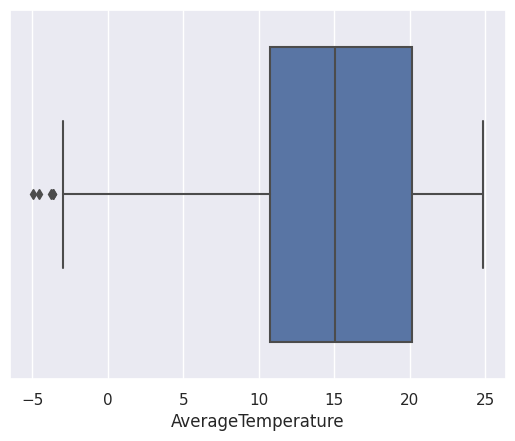

Distribution Analysis - Histogram


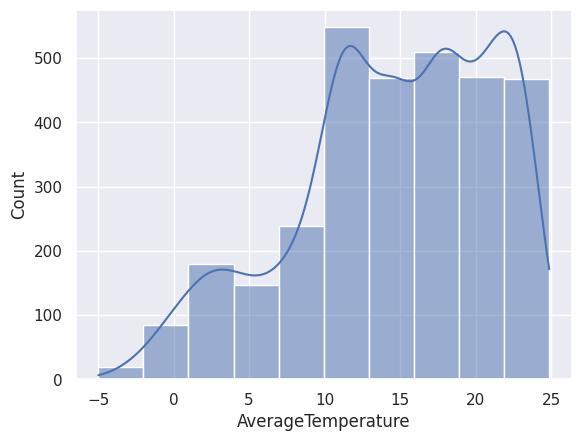

In [45]:
eda_num(df_norte)

## Datos del hemisferio Sur

In [46]:
profile = ProfileReport(df_sur)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Outlier Analysis - Boxplot


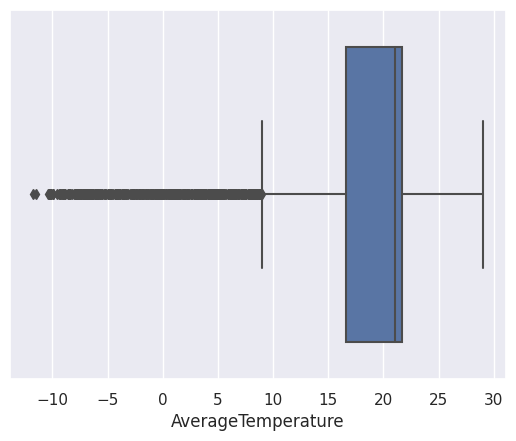

Distribution Analysis - Histogram


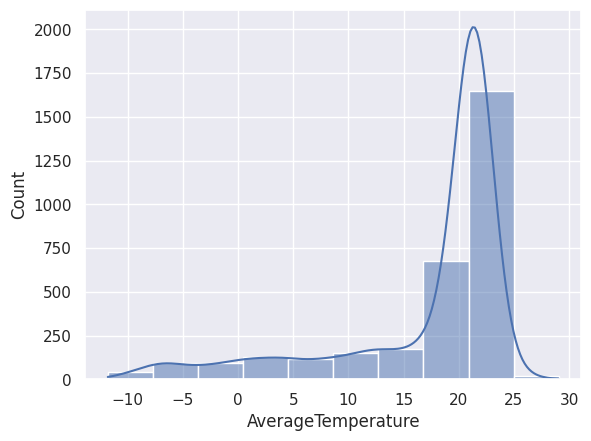

In [47]:
eda_num(df_sur)

## Los data sets estan listos para que se les apliquen los algoritmos de series de tiempo

#### Ahora tenemos 2 datasets para el norte y sur respectivamente con las temperaturas promedio desde ctubre del 1752

## Series de tiempo - Inicio

## Modelos

#### SARIMA - HEMISFERIOS NORTE Y SUR DEL PLANETA

Aplicamos el modelo visto en clase, utilizando los mismos metodos y procedimientos sobre los datasets NORTE y SUR con datos globales. El código se recuperó del material proporcionado en Canvas. 

In [53]:
#importamos las librerias

from numpy import mean
from numpy import median
from numpy import array
import matplotlib.pyplot as plt
from matplotlib import pyplot
import random
from math import sqrt
from sklearn.metrics import mean_squared_error

#
from warnings import catch_warnings
from warnings import filterwarnings

# La librería statsmodel tiene implementaciones de SARIMA 
from statsmodels.tsa.statespace.sarimax import SARIMAX


# Si el computador tiene procesadores múltiples, se aprovecharán
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed

In [54]:
def division_entreno_prueba(datos, n_prueba):
    return datos[:-n_prueba], datos[-n_prueba:]

In [55]:
def medir_rmse(actual, predicho):
    return sqrt(mean_squared_error(actual, predicho))

In [56]:
def validacion_al_frente(datos, n_prueba, metodo, cfg):
    predicciones = []
    # dividir el conjunto de datos
    entreno, prueba = division_entreno_prueba(datos, n_prueba)
    # grabar la historia con el conjunto de datos de entrenamiento
    historia = [x for x in entreno]
    # pasar por cada incremento de tiempo en el conjunto de prueba
    for i in range(len(prueba)):
        # ajustar el modelo a los datos y predecir los datos históricos
        if metodo == "promedio":
            yhat = prediccion_promedio(historia, cfg)
        elif metodo == "sarima":
            yhat = prediccion_sarima(historia, cfg)
        elif metodo == "exp":
            yhat = prediccion_alisamiento_exp(historia, cfg)
        # agregar el dato predicho en la lista de preducciones
        predicciones.append(yhat)
        # agregar la observación a la historia para la siguiente iteración
        historia.append(prueba[i])
    # estimar el error de las predicciones
    error = medir_rmse(prueba, predicciones)
    return [error, predicciones]

In [57]:
def busqueda_malla(datos, lista_cfg, n_prueba, metodo = "sarima", paralelo = True):
    resultados = None
    if paralelo:
        # ejecutar las configuraciones en paralelo
        executor = Parallel(n_jobs = cpu_count(), backend = 'multiprocessing') 
        tareas = (delayed(calificar_modelo)(datos, n_prueba, metodo, cfg) for cfg in lista_cfg) 
        resultados = executor(tareas)
    else:
        resultados = [calificar_modelo(datos, n_prueba, metodo, cfg) for cfg in lista_cfg]
    # eliminar resultados vacíos
    resultados = [r for r in resultados if r[1] != None]
    return resultados

In [58]:
def calificar_modelo(datos, n_prueba, metodo, cfg, debug = False):
    resultado = None
    predicciones = None
    # convertir la confiuración a una llave
    llave = str(cfg)
    if debug:
        resultado, predicciones = validacion_al_frente(datos, n_prueba, metodo, cfg)
    else:
        # una falla durante la validación del modelo sugiere una configuración inestable
        try:
        # nunca mostrar advertencias cuando se busca en malla...demasiado "ruido"
            with catch_warnings():
                filterwarnings("ignore")
                resultado, predicciones = validacion_al_frente(datos, n_prueba, metodo, cfg)
        except:
            error = None
    if resultado is not None:
        print(f' > Modelo{llave} {resultado:.3f}')
    return (llave, resultado, predicciones)

In [59]:
def encontrar_mejor_solucion(series, nombre, metodo = "sarima", muestra = False):
    datos = series.values
    resultados = []
    # dividir los datos
    n_prueba = int(len(datos) * 0.2) # porcenta usado para prueba
    long_max = len(datos) - n_prueba
    print(f"Tamaño Entrenamiento {long_max}")
    print(f"Tamaño Prueba {n_prueba}")

    # configuraciones de los modelos
    print('Test 1')
    if metodo == "sarima":
        print(f"Encontrando la mejor solución para {metodo}")
        lista_cfg = config_sarima()
    elif metodo == "promedio":
        print(f"Encontrando la mejor solución para {metodo}")
        lista_cfg = config_simple(long_max)
    elif metodo == "exp":
        print(f"Encontrando la mejor solución para {metodo}")
        lista_cfg = config_alisamiento_exp()
        datos = datos[:,0]
    # muestrear algunos
    if muestra:
        
        lista_cfg_azar = random.sample(lista_cfg, k = 25)
        while len(resultados) < 5:
            lista_cfg_azar = random.sample(lista_cfg, k = 25)
            resultados += busqueda_malla(datos, lista_cfg_azar, n_prueba, metodo)
    else:
        # búsqueda en malla
              
        # Si se tiene capacidad de procesamiento paralelo, paralelo = True (default)
        paralelo = False
        resultados = busqueda_malla(datos, lista_cfg, n_prueba, metodo, paralelo)
        print('Test 3')
    
    # ordenan las configuraciones por error, ascendente
    resultados.sort(key = lambda tup: tup[1])

    print('terminado')
    # listar las mejores 3 configuraciones
    for cfg, error, predicciones in resultados[:3]:
        print(cfg, error)

    # desplegar
    entreno, prueba = division_entreno_prueba(datos, n_prueba)
    prediccion = pd.DataFrame(list(entreno.flatten()) + resultados[0][2])
    ax = pd.DataFrame(datos).plot(label = "Original") # Datos originales
    prediccion.plot(ax = ax, alpha = .7, figsize = (14,7))
    # Esconder las líneas de malla de la gráfica
    # ax.grid(False)

    # Esconder las marcas en los ejes
    #ax.set_xticks([])
    #ax.set_yticks([])
    print('Test 4')
    plt.savefig(f"{nombre}_{metodo}.png", transparent = True)
    plt.show()

In [60]:
def prediccion_sarima(historia, config):
    orden, orden_estacional, tendencia = config
    # definir el modelo
    modelo = SARIMAX(historia, order = orden, seasonal_order = orden_estacional, trend = tendencia,
      enforce_stationarity = False, enforce_invertibility = False)
    # ajustar el model con los datos
    modelo_ajustado = modelo.fit(disp = False)
    # hacer la predicción de un paso
    yhat = modelo_ajustado.predict(len(historia), len(historia))
    return yhat[0]

def config_sarima(estacional = [0]):
    modelos = []
    # definir las listas de configuración
    p_params = [0, 1, 2]
    d_params = [0, 1]
    q_params = [0, 1, 2]
    t_params = ['n','c','t','ct'] 
    P_params = [0, 1, 2]
    D_params = [0, 1]
    Q_params = [0, 1, 2]
    m_params = estacional
    # crear instancias de configuración
    for p in p_params:
        for d in d_params:
            for q in q_params:
                for t in t_params:
                    for P in P_params:
                        for D in D_params:
                            for Q in Q_params:
                                for m in m_params:
                                    cfg = [(p,d,q), (P,D,Q,m), t]
                                    modelos.append(cfg)
    return modelos

#### Se termino la definicion de las funciones a emplear, procedemos a entrenar y probar modelos, primero con los datos del hmisferio norte: df_norte

In [72]:
series = df_norte[['dt', 'AverageTemperature']]


n_ultimos_meses = 300
series = series.iloc[(len(series)- n_ultimos_meses): , :]


Text(0.5, 1.0, 'HEMISFERIO NORTE')

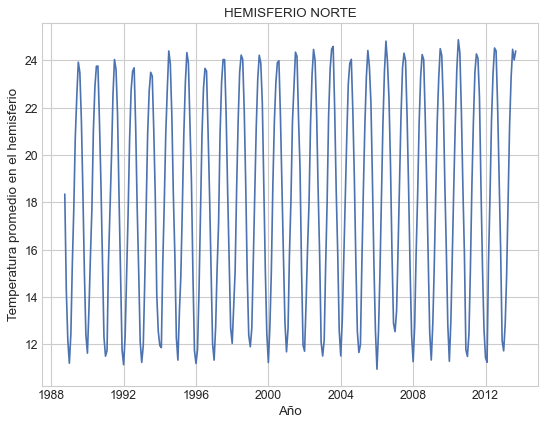

In [75]:
#Graficamos los datos sobre los cuales buscaremos los mejores parametros de aplicacion de SARIMA
figure(figsize=(8, 6), dpi=80)
plt.style.use('seaborn-whitegrid')
plt.plot( series['dt'], series['AverageTemperature'])
plt.xlabel('Año')
plt.ylabel('Temperatura promedio en el hemisferio')
plt.title('HEMISFERIO NORTE')

In [ ]:
#Terminamos de alistar los datos

series.set_index('dt', inplace=True)

nombre = 'Temperaturas_Norte'

# NOTA: 

Debido a la complejidad computacinal del algortimo estudiado en clase y que se reutiliza aqui, y que permite encontrar los valores de los parametros optimos para el modelo SARIMA, se decidio aplciarlo unicamente sobre los ultimos 300 meses.

Sin embargo, como se ve más adelante, el algoritmo de FBProphet si se ejecuto sobre la totalidad de los datos po ser más rápido.

Tamaño Entrenamiento 240
Tamaño Prueba 60
Test 1
Encontrando la mejor solución para sarima
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'n'] 18.969
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'c'] 4.687
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 't'] 10.204
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'ct'] 4.710
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'n'] 9.843
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'c'] 2.705
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 't'] 5.403
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'ct'] 2.715
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'n'] 5.927
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'c'] 1.869
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 't'] 3.256
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'ct'] 1.844
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'n'] 2.427
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'c'] 2.431
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 't'] 2.440
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'ct'] 2.444
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 'n'] 1.660
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 'c'] 1.663
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 't'] 1.669
 > Modelo[(0, 1, 1), (0, 0, 0

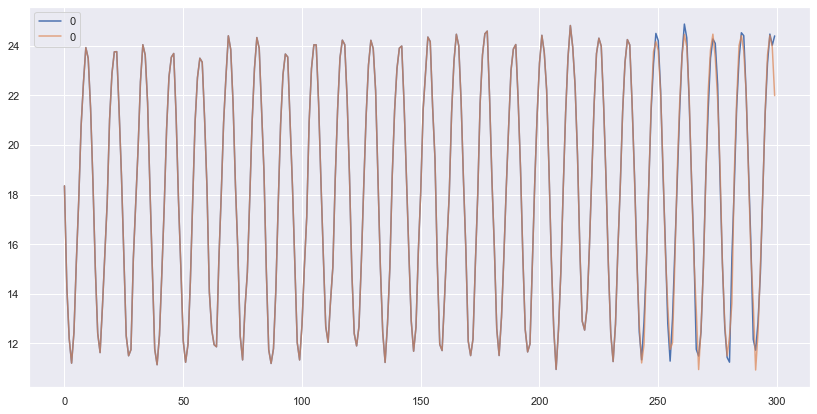

In [63]:
#Corremos el algoritmo para encontrar los parametros que daran lso mejores resultados


encontrar_mejor_solucion(series, nombre, metodo = "sarima")


In [62]:
series.head()

,AverageTemperature
dt,
1988-10-01,18.349164
1988-11-01,14.261842
1988-12-01,12.186467
1989-01-01,11.197048
1989-02-01,12.440570


#### Parametros y modelos optimos del SARIMA para el hemisferio Norte:

1.[(2, 1, 2), (0, 0, 0, 0), 'n'] 0.623237572212671
2. [(2, 1, 2), (0, 0, 0, 0), 'c'] 0.6250629282263924
3. [(2, 0, 2), (0, 0, 0, 0), 'c'] 0.6584187259409453

Como puede verse en la gráfica anterior hemos obtenido una juste casi perfecto a los datos, debido seguramente a la alta estacionalidad que hay en ellos. 

### SARIMA - SUR

Ahora repetimos exactamente el mismo procedimiento para el hemisferios Sur.

In [87]:
serie_sur = df_sur[['dt', 'AverageTemperature']]


n_ultimos_meses = 300
serie_sur = serie_sur.iloc[(len(serie_sur)- n_ultimos_meses): , :]

Text(0.5, 1.0, 'HEMISFERIO SUR')

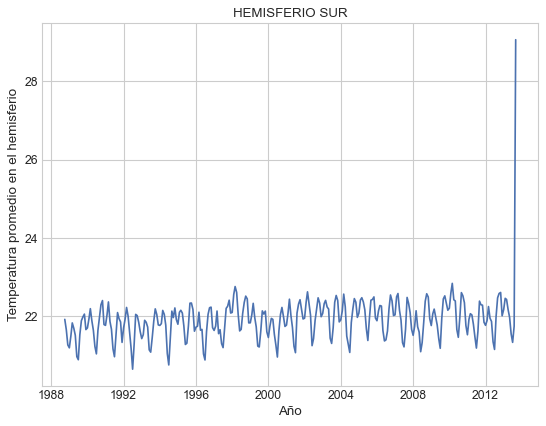

In [88]:
#Graficamos los datos sobre los cuales buscaremos los mejores parametros de aplicacion de SARIMA
figure(figsize=(8, 6), dpi=80)
plt.style.use('seaborn-whitegrid')
plt.plot( serie_sur['dt'], serie_sur['AverageTemperature'])
plt.xlabel('Año')
plt.ylabel('Temperatura promedio en el hemisferio')
plt.title('HEMISFERIO SUR')

#### En la grafica anterior podemos ver que hay cierta estacionalidad en los datos, sin embargo no es tan obvia como para el conjunto de datos del norte

In [89]:
#Terminamos de alistar los datos

serie_sur.set_index('dt', inplace=True)

nombre_sur = 'Temperaturas_Sur'

Tamaño Entrenamiento 240
Tamaño Prueba 60
Test 1
Encontrando la mejor solución para sarima
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'n'] 22.165
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'c'] 1.024
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 't'] 10.884
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'ct'] 0.992
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'n'] 11.355
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'c'] 0.971
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 't'] 5.596
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'ct'] 0.954
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'n'] 6.306
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'c'] 0.955
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 't'] 3.367
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'ct'] 0.944
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'n'] 1.009
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'c'] 1.010
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 't'] 1.010
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'ct'] 1.011
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 'n'] 0.982
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 'c'] 0.982
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 't'] 0.993
 > Modelo[(0, 1, 1), (0, 0, 

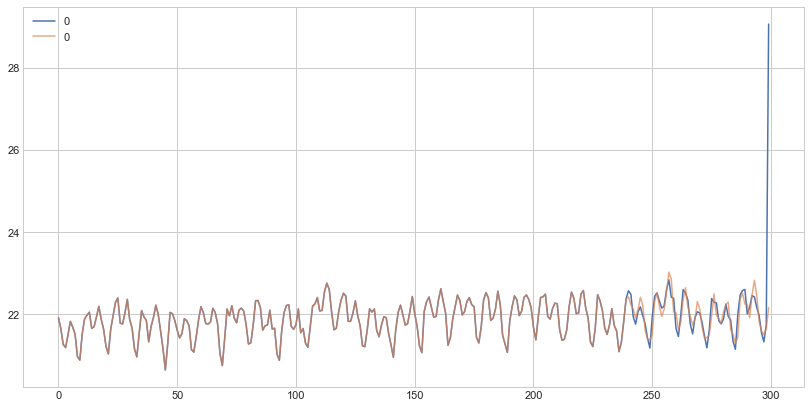

In [90]:
#Corremos el algoritmo para encontrar los parametros que daran lso mejores resultados


encontrar_mejor_solucion(serie_sur, nombre_sur, metodo = "sarima")

#### Parametros y modelos optimos del SARIMA para el hemisferio Norte:

1.[(2, 1, 2), (0, 0, 0, 0), 'n'] 0.623237572212671
2. [(2, 1, 2), (0, 0, 0, 0), 'c'] 0.6250629282263924
3. [(2, 0, 2), (0, 0, 0, 0), 'c'] 0.6584187259409453

Aquí también,  hemos obtenido un ajuste casi perfecto a los datos, debido seguramente a la alta estacionalidad que hay en ellos.

Ademas, las prediciones para los ultimos 60 meses presentan una desviacion satisfactoria respecto a los datos reales.

#### SARIMA -  GUATE
Finalmente, replicamos el procedimiento anterior sobre el dataset que solo contiene la informacion de Guatemala.

In [61]:
serie_Guate = df_Guate[['dt', 'AverageTemperature']]


n_ultimos_meses = 300
serie_Guate = serie_Guate.iloc[(len(serie_Guate)- n_ultimos_meses): , :]

Text(0.5, 1.0, 'GUATEMALA')

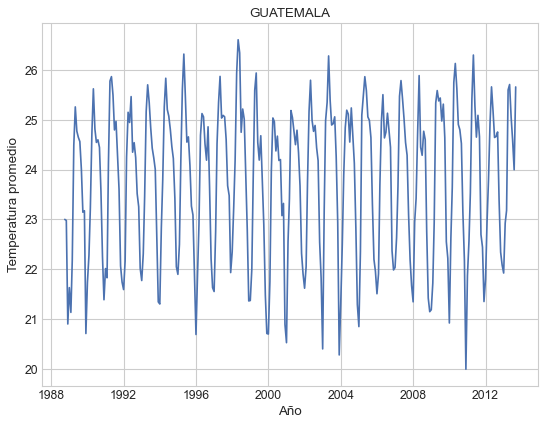

In [62]:
#Graficamos los datos sobre los cuales buscaremos los mejores parametros de aplicacion de SARIMA
figure(figsize=(8, 6), dpi=80)
plt.style.use('seaborn-whitegrid')
plt.plot( serie_Guate['dt'], serie_Guate['AverageTemperature'])
plt.xlabel('Año')
plt.ylabel('Temperatura promedio')
plt.title('GUATEMALA')

#### Aqui tambien puede verse un alto nivel de estacionalidad, lo cualq debería de ayudar al modelo a ajustarse, sin embargo, ya que solo se estan empleando los ultimos 300 meses de informacion es dificil ver un comportamiento alcista.

In [63]:
#Terminamos de alistar los datos

serie_Guate.set_index('dt', inplace=True)

nombre_Guate = 'Temperaturas_Guate'

Tamaño Entrenamiento 240
Tamaño Prueba 60
Test 1
Encontrando la mejor solución para sarima
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'n'] 23.845
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'c'] 1.593
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 't'] 12.060
 > Modelo[(0, 0, 0), (0, 0, 0, 0), 'ct'] 1.603
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'n'] 12.000
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'c'] 1.131
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 't'] 6.125
 > Modelo[(0, 0, 1), (0, 0, 0, 0), 'ct'] 1.137
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'n'] 7.622
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'c'] 1.006
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 't'] 3.936
 > Modelo[(0, 0, 2), (0, 0, 0, 0), 'ct'] 0.986
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'n'] 1.089
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'c'] 1.091
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 't'] 1.095
 > Modelo[(0, 1, 0), (0, 0, 0, 0), 'ct'] 1.097
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 'n'] 1.046
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 'c'] 1.048
 > Modelo[(0, 1, 1), (0, 0, 0, 0), 't'] 1.052
 > Modelo[(0, 1, 1), (0, 0, 

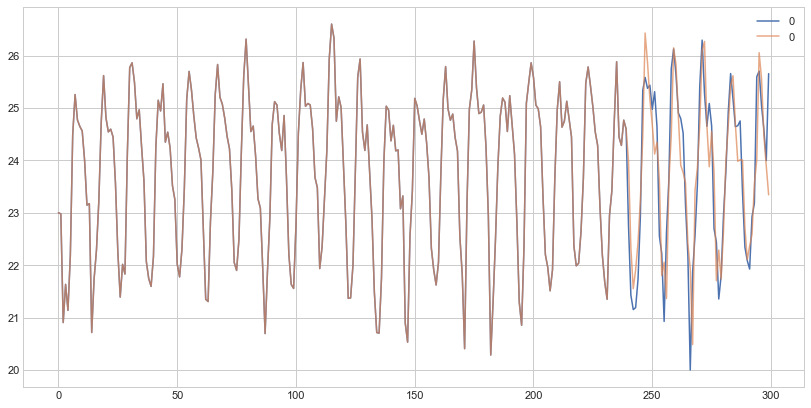

In [64]:
#Corremos el algoritmo para encontrar los parametros que daran lso mejores resultados


encontrar_mejor_solucion(serie_Guate, nombre_Guate, metodo = "sarima")

#### FBPROPHET

Para entrenar los modelos, tendremos que dejar unicamente dos columnas con los valores y & df respectivamente.

In [66]:

first_columnNorte = df_norte.pop('AverageTemperature')
first_columnSur = df_sur.pop('AverageTemperature')
df_norte.insert(0, 'AverageTemperature', first_columnNorte)
df_sur.insert(0, 'AverageTemperature', first_columnSur)

In [67]:
df_norte.drop(['Hemisphere'], axis=1, inplace=True)
df_sur.drop(['Hemisphere'], axis=1, inplace=True)
df_norte.columns = ['y', 'ds']
df_sur.columns = ['y', 'ds']

In [68]:
df_norte.head()

,y,ds
0,8.610429,1752-10-01
1,5.742388,1752-11-01
2,2.142102,1752-12-01
3,-1.544942,1753-01-01
4,0.095615,1753-02-01


In [69]:
df_sur.head()

,y,ds
0,10.253,1752-10-01
1,6.703,1752-11-01
2,1.980,1752-12-01
3,-2.393,1753-01-01
4,-0.629,1753-02-01


#### Antes de aplicar Prophet, graficamos los datos para ver si hay tendencias, patrones, etc...:

Text(0.5, 1.0, 'HEMISFERIO NORTE')

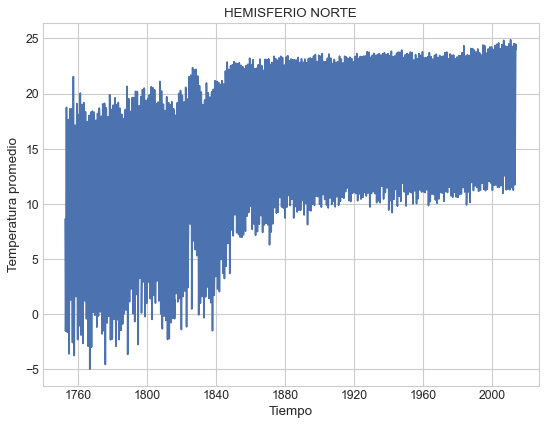

In [70]:
#Graficamos los datos del hemisferios norte
figure(figsize=(8, 6), dpi=80)
plt.style.use('seaborn-whitegrid')
plt.plot( df_norte['ds'], df_norte['y'])
plt.xlabel('Tiempo')
plt.ylabel('Temperatura promedio')
plt.title('HEMISFERIO NORTE')

Text(0.5, 1.0, 'HEMISFERIO SUR')

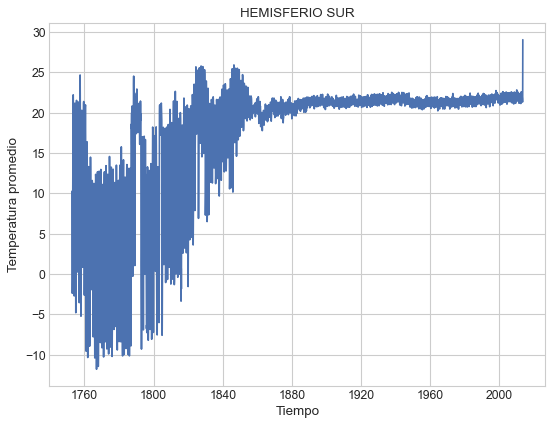

In [71]:
#Graficamos los datos del hemisferios sur
figure(figsize=(8, 6), dpi=80)
plt.style.use('seaborn-whitegrid')
plt.plot( df_sur['ds'], df_sur['y'])
plt.xlabel('Tiempo')
plt.ylabel('Temperatura promedio')
plt.title('HEMISFERIO SUR')

Text(0.5, 1.0, 'GUATEMALA')

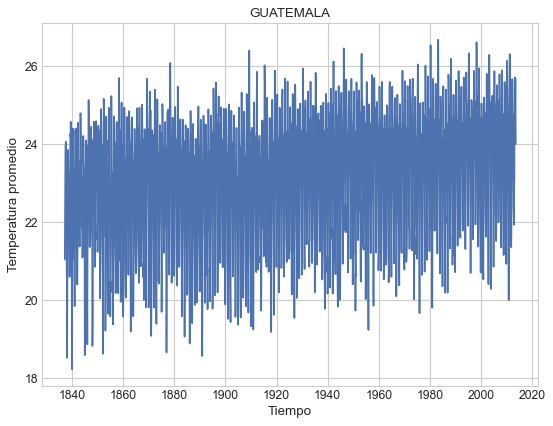

In [72]:
#Graficamos los datos de Guatemala
figure(figsize=(8, 6), dpi=80)
plt.style.use('seaborn-whitegrid')
plt.plot( df_Guate['dt'], df_Guate['AverageTemperature'])
plt.xlabel('Tiempo')
plt.ylabel('Temperatura promedio')
plt.title('GUATEMALA')

### Comentarios sobre las gráficas anteriores:

Podemos ver que en lso 3 casos hay un incremento a lo largo de los siglos de la temperatura. En particular con los datos del hemisfero norte, puede incluso observarse un incremento en el regimen de ascenso de la temperatura del hemisferio alrededor de los años 1850-1880. Esto no es sorprendente ya que estas fechas coinciden con la revolucion industrial y, la llegada de maquinas de vapor y consecuentemente un incremento en el uso del carbón!

Además, todas presentan algun tipo de estacionalidad y por supuesto una tendencia alcista. Guatemala por su parte ha experimentado pocos cambios en su temperatura a lo largo de los ultimos 200 años, sin embargo también es clara una tendencia alcista, con temperaturas minimas de hasta 18 grados en 1840 y no menores a 19 en 2013. Mostrando un incremento global de al menos 1 grado en las mediciones para Guatemala.

#### Esto comprueba que si existe un incremento en la temperatura del planeta a lo largo de los ultimos 300 años.

In [53]:
from prophet import Prophet

## Entrenamos a ambos modelos

In [96]:
mNorte = Prophet(interval_width=0.95, daily_seasonality=True)
mSur = Prophet(interval_width=0.95, daily_seasonality=True)
modelNorte = mNorte.fit(df_norte)
modelSur = mSur.fit(df_sur)

INFO:numexpr.utils:NumExpr defaulting to 4 threads.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.


### Posteriormente procedemos a realizar predicciones, primerio al hemisferio norte y luego al sur

In [97]:
futurosNorte = mNorte.make_future_dataframe(periods=180, freq='M')
forecastNorte = mNorte.predict(futurosNorte)
forecastNorte.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1752-10-01,8.565521,5.469614,10.882390,8.565521,8.565521,-0.311984,-0.311984,-0.311984,-0.101113,-0.101113,-0.101113,-0.210871,-0.210871,-0.210871,0.0,0.0,0.0,8.253538
1,1752-11-01,8.567482,2.148984,7.592734,8.567482,8.567482,-3.766971,-3.766971,-3.766971,-0.101113,-0.101113,-0.101113,-3.665859,-3.665859,-3.665859,0.0,0.0,0.0,4.800511
2,1752-12-01,8.569380,-0.974471,4.543600,8.569380,8.569380,-6.762059,-6.762059,-6.762059,-0.101113,-0.101113,-0.101113,-6.660947,-6.660947,-6.660947,0.0,0.0,0.0,1.807321
3,1753-01-01,8.571341,-2.099615,3.643385,8.571341,8.571341,-7.762899,-7.762899,-7.762899,-0.101113,-0.101113,-0.101113,-7.661787,-7.661787,-7.661787,0.0,0.0,0.0,0.808441
4,1753-02-01,8.573302,0.168816,5.360535,8.573302,8.573302,-5.824071,-5.824071,-5.824071,-0.101113,-0.101113,-0.101113,-5.722959,-5.722959,-5.722959,0.0,0.0,0.0,2.749231


In [98]:
forecastNorte.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
3307,2028-04-30,18.511686,19.264042,24.450825,18.128024,18.846050,3.305549,3.305549,3.305549,-0.101113,-0.101113,-0.101113,3.406662,3.406662,3.406662,0.0,0.0,0.0,21.817235
3308,2028-05-31,18.512825,21.615426,26.890945,18.124955,18.849924,5.705993,5.705993,5.705993,-0.101113,-0.101113,-0.101113,5.807105,5.807105,5.807105,0.0,0.0,0.0,24.218818
3309,2028-06-30,18.513928,22.862365,28.181011,18.121985,18.853632,6.972899,6.972899,6.972899,-0.101113,-0.101113,-0.101113,7.074011,7.074011,7.074011,0.0,0.0,0.0,25.486826
3310,2028-07-31,18.515067,22.163812,27.747847,18.118916,18.857456,6.595189,6.595189,6.595189,-0.101113,-0.101113,-0.101113,6.696301,6.696301,6.696301,0.0,0.0,0.0,25.110256
3311,2028-08-31,18.516206,20.295857,25.845092,18.115848,18.861276,4.512912,4.512912,4.512912,-0.101113,-0.101113,-0.101113,4.614024,4.614024,4.614024,0.0,0.0,0.0,23.029118


In [99]:
futurosSur = mSur.make_future_dataframe(periods=180, freq='M')
forecastSur = mSur.predict(futurosSur)
forecastSur.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1752-10-01,9.352537,-2.996376,13.358098,9.352537,9.352537,-3.732388,-3.732388,-3.732388,-3.264251,-3.264251,-3.264251,-0.468137,-0.468137,-0.468137,0.0,0.0,0.0,5.620149
1,1752-11-01,9.341395,-3.877750,12.769473,9.341395,9.341395,-4.626786,-4.626786,-4.626786,-3.264251,-3.264251,-3.264251,-1.362535,-1.362535,-1.362535,0.0,0.0,0.0,4.714608
2,1752-12-01,9.330612,-5.386790,11.987467,9.330612,9.330612,-6.239101,-6.239101,-6.239101,-3.264251,-3.264251,-3.264251,-2.974850,-2.974850,-2.974850,0.0,0.0,0.0,3.091511
3,1753-01-01,9.319470,-5.490935,11.087344,9.319470,9.319470,-6.138634,-6.138634,-6.138634,-3.264251,-3.264251,-3.264251,-2.874384,-2.874384,-2.874384,0.0,0.0,0.0,3.180835
4,1753-02-01,9.308327,-3.508734,12.742984,9.308327,9.308327,-4.795321,-4.795321,-4.795321,-3.264251,-3.264251,-3.264251,-1.531070,-1.531070,-1.531070,0.0,0.0,0.0,4.513007


In [100]:
forecastSur.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
3307,2028-04-30,25.211457,14.987593,32.244142,24.563389,26.069332,-1.723516,-1.723516,-1.723516,-3.264251,-3.264251,-3.264251,1.540735,1.540735,1.540735,0.0,0.0,0.0,23.487941
3308,2028-05-31,25.211946,15.128432,31.499790,24.559111,26.079715,-1.054893,-1.054893,-1.054893,-3.264251,-3.264251,-3.264251,2.209358,2.209358,2.209358,0.0,0.0,0.0,24.157054
3309,2028-06-30,25.212420,16.329509,32.579619,24.554032,26.089726,-0.898095,-0.898095,-0.898095,-3.264251,-3.264251,-3.264251,2.366156,2.366156,2.366156,0.0,0.0,0.0,24.314325
3310,2028-07-31,25.212910,15.853330,32.750037,24.546993,26.100076,-0.897055,-0.897055,-0.897055,-3.264251,-3.264251,-3.264251,2.367195,2.367195,2.367195,0.0,0.0,0.0,24.315854
3311,2028-08-31,25.213399,16.227055,32.786947,24.539957,26.110426,-0.818950,-0.818950,-0.818950,-3.264251,-3.264251,-3.264251,2.445300,2.445300,2.445300,0.0,0.0,0.0,24.394449


### Gráfico predicciones del hemisferio norte 

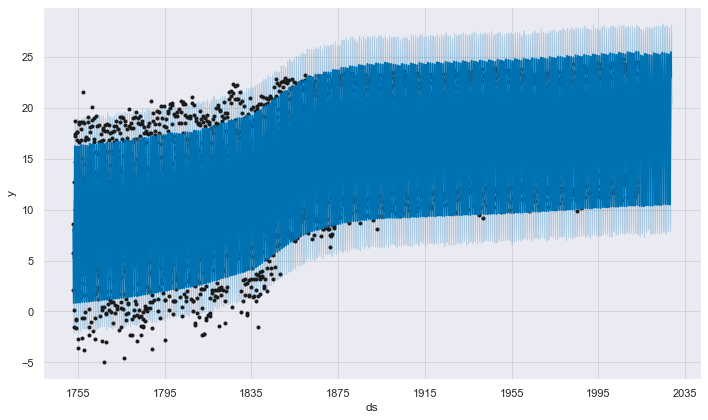

In [101]:
plot1Norte = mNorte.plot(forecastNorte)

### Gráfico predicciones del hemisferio sur 

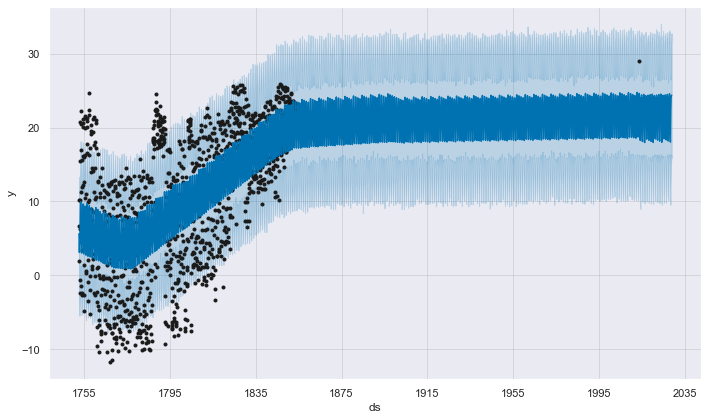

In [102]:
plot1Sur = mSur.plot(forecastSur)

### Predicción de componentes hemisferio norte

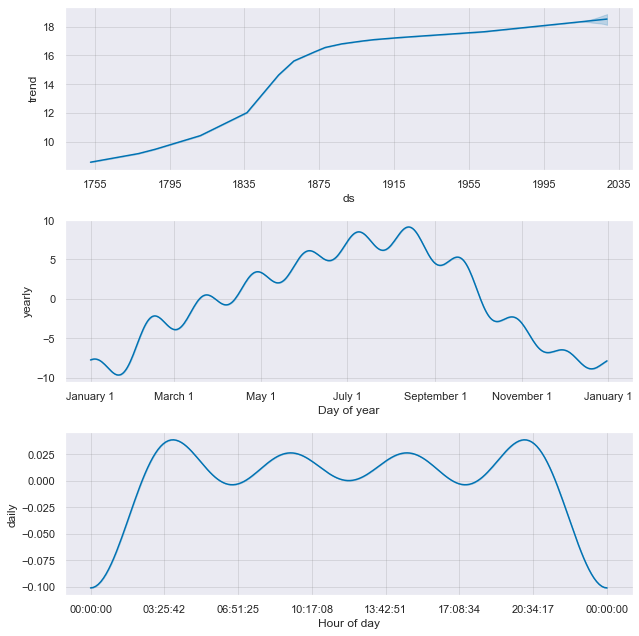

In [103]:
plotCompomentesNorte = mNorte.plot_components(forecastNorte)

### Predicción de componentes hemisferio sur

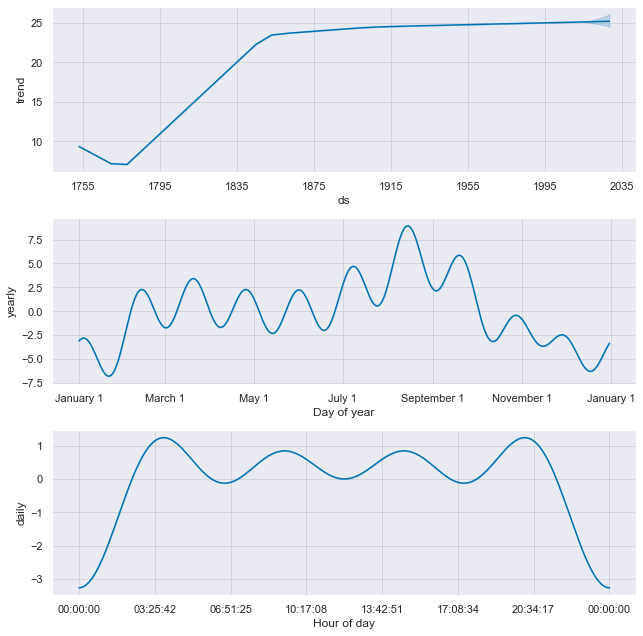

In [104]:
plotCompomentesSur = mSur.plot_components(forecastSur)

## Repetimos el procedimiento con Prophet para Guatemala

In [97]:
first_columnGuate = df_Guate.pop('AverageTemperature')

df_Guate.insert(0, 'AverageTemperature', first_columnGuate)

df_Guate.drop(['Country'], axis=1, inplace=True)

df_Guate.columns = ['y', 'ds']

df_Guate.head(10)

,y,ds
0,21.038,1837-02-01
1,21.850,1837-03-01
2,22.592,1837-04-01
3,23.827,1837-05-01
4,23.992,1837-06-01
5,24.056,1837-07-01
6,23.805,1837-08-01
7,23.237,1837-09-01
8,21.567,1837-10-01
9,20.652,1837-11-01


In [98]:
df_Guate = df_Guate[df_Guate.columns[::-1]]

In [104]:
df_Guate.head()

,ds,y
0,1837-02-01,21.038
1,1837-03-01,21.850
2,1837-04-01,22.592
3,1837-05-01,23.827
4,1837-06-01,23.992


In [102]:
modelo_Guate = Prophet(interval_width=0.95)

modelo_Guate.fit(df_Guate)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [103]:
fechas_futuras = modelo_Guate.make_future_dataframe(periods=120, freq='MS')
fechas_futuras.tail()

,ds
2235,2023-05-01
2236,2023-06-01
2237,2023-07-01
2238,2023-08-01
2239,2023-09-01


In [105]:
prediccion = modelo_Guate.predict(fechas_futuras)

In [106]:
prediccion[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2235,2023-05-01,26.144107,25.071354,27.194779
2236,2023-06-01,25.396204,24.328221,26.429983
2237,2023-07-01,24.955657,23.802930,26.049709
2238,2023-08-01,25.116083,24.046864,26.153065
2239,2023-09-01,24.847825,23.792397,25.999970


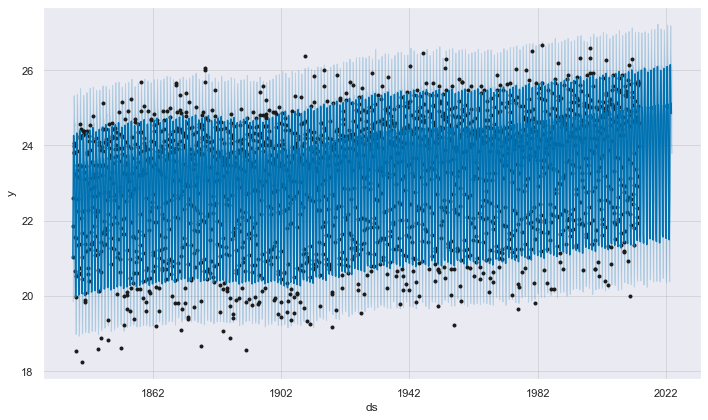

In [107]:
modelo_Guate.plot(prediccion,uncertainty=True);

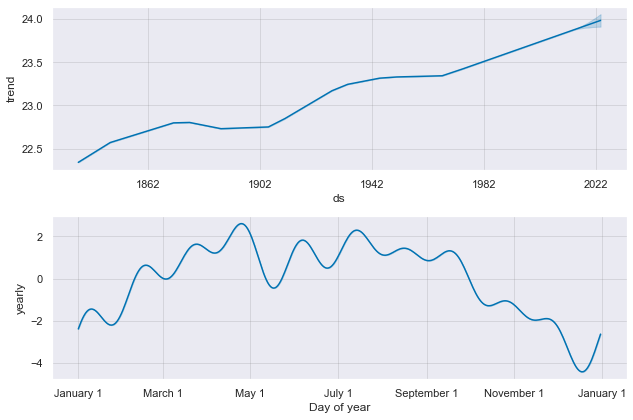

In [108]:
modelo_Guate.plot_components(prediccion);

### Conclusiones:

1. La tendencia alcista de la temperatura observada en los 3 datasets estudiados comprueba un incremento global de entre 1 y 3 grados centigrados en promedio en los utlimos 300 años.
2. Aunque el metodo SARIMA permitio ajustes casi perfectos a los datos y excelentes prediciones, el procedimiento utilizado para encontrar los parametros optimos vuelve el algoritmo poco escalable.
3. La tendencia alcista de la temperatura tambien puede confirmarse en las gráficas de las componentes mostradas al aplicar FBProphet. 
4. Además, la gráfica de componentes anual correspondiente al analisis realizado para el hemisferio norte muetra una clara estcionalidad con temperaturas mas elevadas en los mese de mayo a septiembre, los cuales corresponden al verano en esa parte del hemisferio. Esto comprueba que el modelo se esta ajustando adecuadamente a los datos.
5. Aunque el metodo SARIMA no presentó niguna falla o mala adecuación a los datos, la complejidad computacional del metodo que permite encontrar sus parametros optimos vuelve al algoritmo FBProphet una mucho mejor opcion ya que este puudo aplicarse con resultados equivalentes a la todalidad de los datasets es decir sobre series de tiempod de casi 300 años con frecuencia mensual.